
<img src="https://www.fee.unicamp.br/sites/default/files/imagens/Logo_FEEC2_cpg.png" width="140"> | FACULDADE DE ENGENHARIA ELÉTRICA E DE COMPUTAÇÃO | <img src="https://www.fee.unicamp.br/sites/all/themes/theme537/images/unicamp.png" width="80"> 
-----|-----|----- 
 | | 



**Aluno:** Luiz Eduardo Pita Mercês Almeida 

**RA:** l229078 

**Professora:** Letícia Rittner 

**Disciplina:** Processamento Digital de Imagens 


# Localização automática de placas veiculares em fotografias de ambiente externo com uso de técnicas de Processamento Digital de Imagens

Esse notebook busca desenvolver um algoritmo que aplique técnicas de PDI como detectores de borda e/ou operadores morfológicos para localização automática de placas veiculares. As imagens alvos são fotografias de ambiente externo durante o dia de uma rua com a aquisição da frente de veículos. Assim, o objetivo principal é a realização do localizador e a comparação de algumas técnicas, ficando como metas adicionais a segmentação de caracteres e o OCR da placa. 

A localização de placas veiculares apesar de ser um tema que possui muitas abordagens e soluções, encontra desafios quando se fala de ambientes externos, com carros em movimento ou sem uma distância fixa da câmera. O desafio desse trabalho é realizar a localização da placa a partir de técnicas mais clássicas do PDI.

### Sumário

1. Importações, funções auxiliares e leitura das imagens
1. Algoritmos de localização de candidatos

    1. Algoritmo de localização baseado em detectores de borda
    1. Algoritmo de localização baseado em operadores morfológicos
    
1. Algoritmo de Seleção de melhor candidato

    1. Regiões internas uniformes
    
1. Aperfeiçoamento do Algoritmo para melhoria dos Resultados
1. Resultados
1. Referências


### 1. Importações, funções auxiliares e leitura das imagens

##### Importações
São importados as bibliotecas OpenCV, Numpy e Matplotlib

In [11]:
# Importação de bibliotecas OpenCV, MatplotLib e Numpy
import cv2 # biblioteca de visao computacional OpenCV
import numpy as np # biblioteca de manipulacao de vetores e ferramentas matematicas e cientificas Numpy
import matplotlib as mpl # biblioteca de manipulacao e exibicao de dados Matplotlib
from matplotlib import pyplot as plt # Pyplot: modulo do Matplotlib para exibir as imagens 
# utilizacao do matplotlib em formatacao para o Jupyter
%matplotlib inline 

##### Funções auxiliares

In [12]:
# variáveis globais
candidatos = []
minArea = 800 #definição da menor área de uma placa, baseado na menor placa de posível leitura
maxArea = 15000 #definição da maior área, baseado na maior placa encontrada (mais próxima da câmera)

def makeSafeCrop(img,rois, sf_zonex=0, sf_zoney=0,fatorx=2, fatory=2):
    crops = []
    for plate in rois:
        ny = plate[1] - sf_zoney
        nx = plate[0] - sf_zonex
        nh = plate[3] + fatory*sf_zoney
        nw = plate[2] + fatorx*sf_zonex
        if (nx <= 0): nx == 1
        if (ny <= 0): ny == 1
        if (nx+nw >= img.shape[1]): nw =  img.shape[1] - nx -1
        if (ny+nh >= img.shape[0]): nh =  img.shape[0] - ny -1
        if (nh == 0):
            nh = plate[3]
        if (nw == 0):
            nw = plate[2]
        crop = img[ny:ny+nh,nx:nx+nw]
        crops.append(crop)
    return crops

##### Leitura das Imagens do Banco de Dados

Nesse notebook é utilizado imagens do Dataset fornecido pelo laboratório SSIG da UFMG, o SSIG-SegPlate. Esse banco é constituído de fotos de câmera estática FullHD contendo 101 veículos brasileiros rastreados com cerca de 20 fotos por veículo. São cerca de 2000 imagens na média de 4.1MB totalizando 8.6GB e composta por imagens de motos, taxis, caminhões e carros em diferentes situações de iluminação e sombreamento. Dentre as imagens da base apenas 20 delas estão disponíveis para exibição.


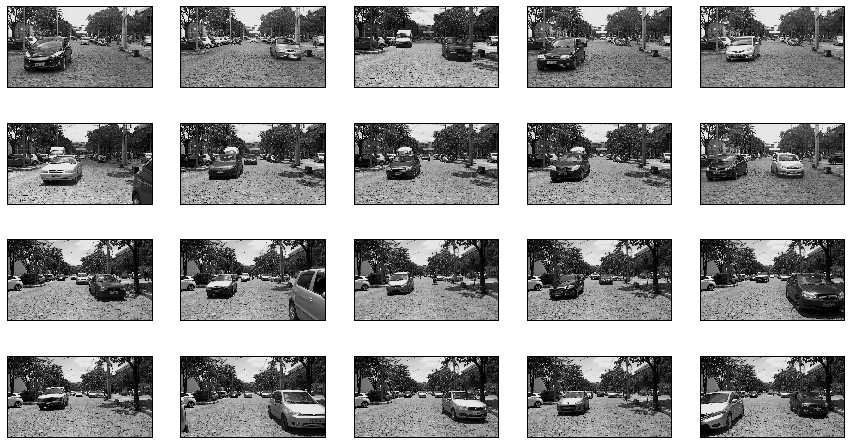

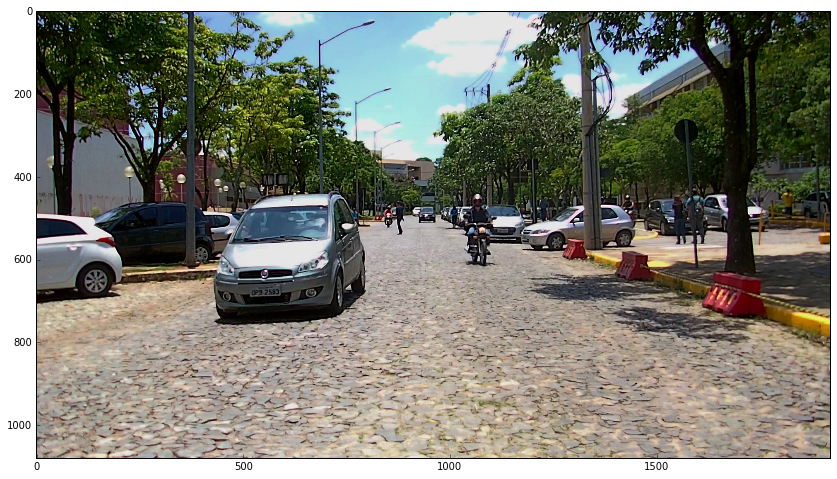

In [13]:
# Carregando as imagens e convertendo para escala de cinza
path = '../Data/' # caminho para a pasta das imagens
img_color = [] # lista de imagens coloridas
img = [] # lista de imagens em tons de cinza
plt.figure(figsize=(15,8)) # definição do tamanho da janela de exibição das imagens
# A cada iteração uma imagem é carregada e convertida para tons de cinza, ao passo que é armazenada nas listas acima 
for i in range(0,20): # A pasta data possui 20 imagens, i ira variar de 0 a 19
    # a funcao do OpenCV imread() realiza a leitura do arquivo de imagem
    # a funcao do OpenCV cvtColor() é usada para conversão de espaco de cores no caso RGB para GRAY
    img_color.append(cv2.imread(path + str(i+1) + '.png')) 
    img.append(cv2.cvtColor(img_color[i],cv2.COLOR_RGB2GRAY))  
    #Exibicao das imagens
    plt.subplot(4,5,i+1) #Cria subplots na imagem que possuira 4 linhas e 5 colunas com elementos de 1 a 20
    plt.imshow(img[i],cmap='gray') # Exibe a imagem com mapa de cores Gray
    plt.xticks([]), plt.yticks([]) # Remove a exibição dos valores das dimensões das imagens nos eixos x e y
# Visualização de uma única imagem em cor
plt.figure(figsize=(15,8)) 
plt.imshow(cv2.cvtColor(img_color[12], cv2.COLOR_BGR2RGB),cmap='gray')

### 2. Algoritmos de Localização de Possíveis candidatos a placas de carros
#### A. Algoritmo baseado na detecção de bordas
   [LINK PARA NOTEBOOK DE EXPERIMENTAÇÃO](candidatos_Bordas.ipynb)
    
    Esse algoritmo utiliza-se, principalmente, do gradiente de Sobel para detectar as bordas seguido de operações morfológicas e em seguida usa um algoritmo de busca de contornos para extrair a placa com base em suas características físicas como Aspect Ratio, formato, área máxima e área mínima. Essa técnica foi vista em alguns artigos que a utilizaram para ambientes mais controlados.



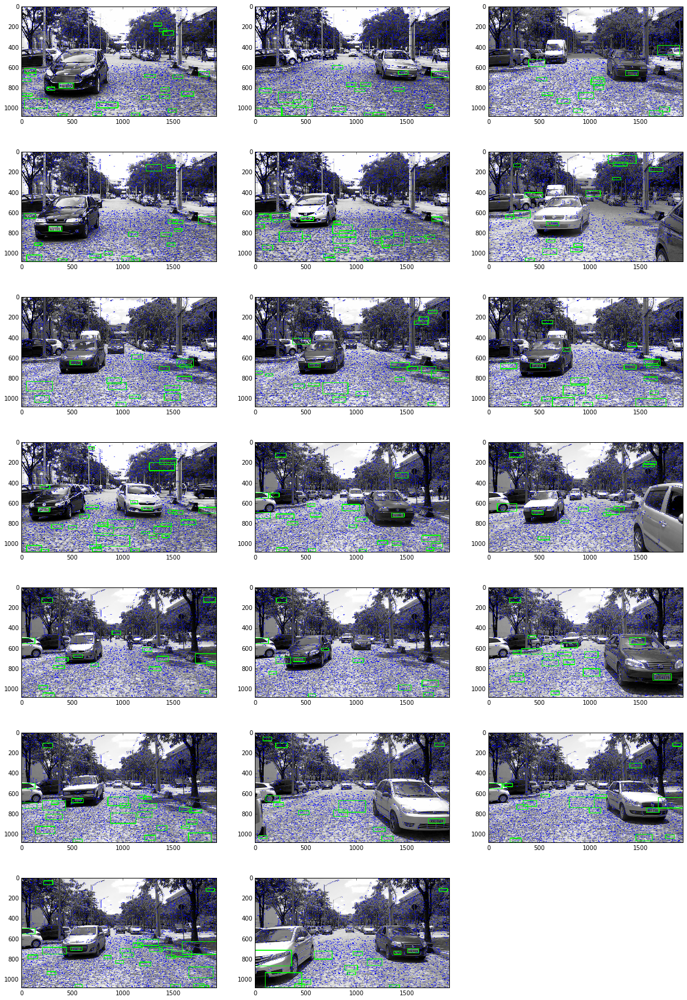

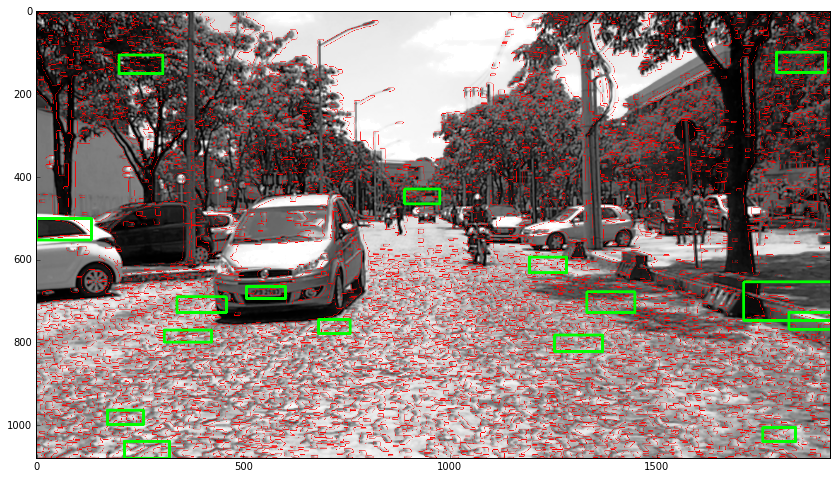

In [14]:
plt.figure(figsize=(20,30))
colors2show = []
for i in range(0,20):
    im = img[i]
    im = cv2.blur(im,(5,5))
    im = cv2.equalizeHist(im)
    sobelx = cv2.Sobel(im,cv2.CV_64F,1,0,ksize=5) # filtro de sobel eixo x
    sobelx = cv2.normalize(sobelx, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    _,xthr = cv2.threshold(sobelx,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    if(np.sum(xthr.ravel())/(xthr.shape[0]*xthr.shape[1]) > 127): xthr = 255 - xthr
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(12,2)) # MORPH_RECT devido ao formato da placa 
    morphDx = cv2.dilate(xthr,kernel,1)
    _,contours, hierarch = cv2.findContours(morphDx, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    color = cv2.cvtColor(im,cv2.COLOR_GRAY2BGR)
    cv2.drawContours(color, contours, -1, (0,0,255), 1)
    rois1 = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if(area < maxArea and area > minArea):
            x,y,w,h = cv2.boundingRect(cnt)
            #cv2.rectangle(color,(x,y),(x+w,y+h),(255,0,0),3)
            ar = 1.0*h/w
            if(ar >= 0.25 and ar <= 0.45):
                cv2.rectangle(color,(x,y),(x+w,y+h),(0,255,0),5)
                rois1.append([x,y,w,h])
    
    for crop in makeSafeCrop(img[i],rois1):
        candidatos.append(crop)    
    colors2show.append(color)
    plt.subplot(7,3,i+1)
    plt.imshow(color,cmap='gray')
    
plt.figure(figsize=(15,8)) 
plt.imshow(cv2.cvtColor(colors2show[12], cv2.COLOR_BGR2RGB),cmap='gray')

#### B. Algoritmo baseado em Operações morfológicas
   [LINK PARA NOTEBOOK DE EXPERIMENTAÇÃO](candidatos_Morfologia.ipynb)
    
    Esse algoritmo utiliza-se das operações morfológicas TOPHAT, abertura e fechamento para encontrar o formato retangular das placas na figura. O TOPHAT é utilizado para aumentar o contraste entre a placa e o fundo sem danificar os caracteres. A abertura elimina ruídos indesejados e o fechamento restaura os efeitos causados pela abertura. Nessas operações utilizou-se sempre um elemento estruturante retangular.

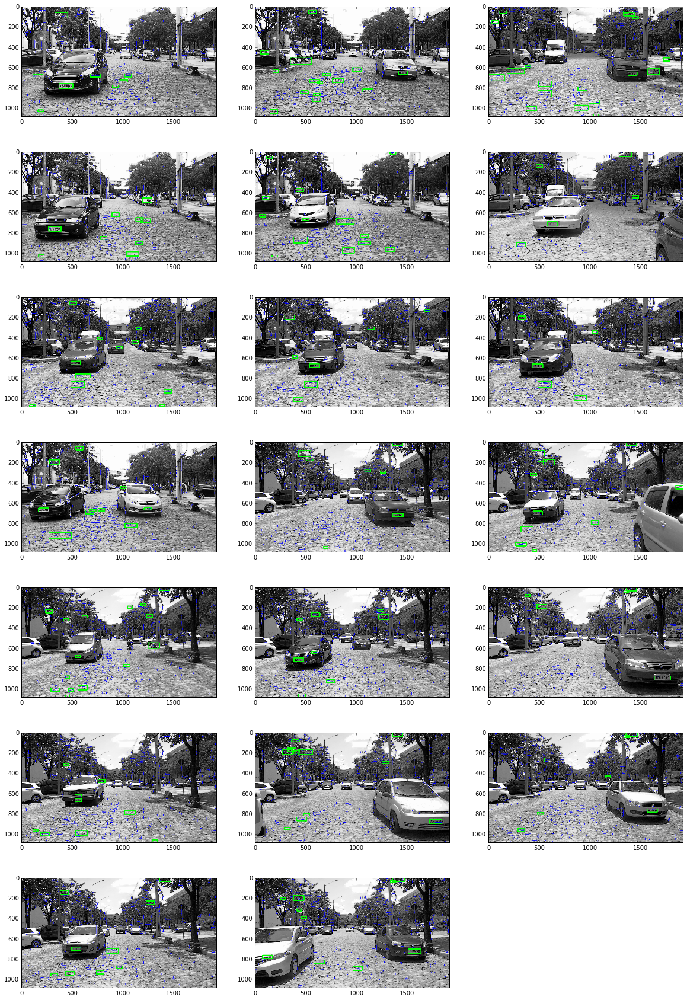

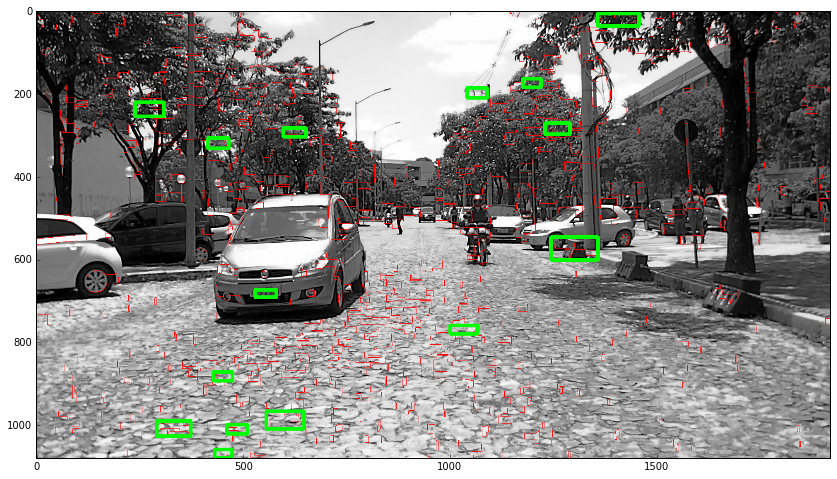

In [15]:
plt.figure(figsize= (20, 30)) #dimensões da janela do MatplotLib
colors2show = []
for i in range(0,20): #iteração sobe as 20 imagens
    im = img[i] # leitura de uma única imagem por vez
    im = cv2.equalizeHist(im) # equalização de histograma
    # Definição do Elemento Estruturante para o TOPHAT
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(19,14)) # MORPH_RECT devido ao formato da placa 
    # Aplicação da operação morfológica TOPHAT
    morphTH = cv2.morphologyEx(im,cv2.MORPH_TOPHAT,kernel)
    # Limiarização por Otsu
    _,thr = cv2.threshold(morphTH,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    # Definição do Elemento Estruturante para a ABERTURA
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(1,14)) # MORPH_RECT devido ao formato da placa 
    # Aplicação da operação morfológica ABERTURA
    morphAx = cv2.morphologyEx(thr,cv2.MORPH_OPEN,kernel)
    # Definição do Elemento Estruturante para o FECHAMENTO
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(27,1)) # MORPH_RECT devido ao formato da placa 
    # Aplicação da operação morfológica Fechamento
    morphFx = cv2.morphologyEx(morphAx,cv2.MORPH_CLOSE,kernel)
    # Busca de contornos
    _,contours1, hierarch = cv2.findContours(morphFx, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    color = cv2.cvtColor(im,cv2.COLOR_GRAY2BGR) # imagem colorida a partir de uma em grayscale para exibição
    cv2.drawContours(color, contours1, -1, (0,0,255), 1)
    rois2 = []
    # iteração sobre todos os contornos no vetor contours1
    for cnt in contours1:
        x,y,w,h = cv2.boundingRect(cnt)
        ar = 1.0*h/w 
        #cv2.rectangle(color,(x,y),(x+w,y+h),(255,0,0),6)
        #cv2.putText(color,str(round(ar, 2)),(x,y),cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,0,255), 2)
        if(ar >= 0.25 and ar <= 0.5 and h*w > minArea and h*w < maxArea): # Seleção por características
            cv2.rectangle(color,(x,y),(x+w,y+h),(0,255,0),8)  
            rois2.append([x,y,w,h])
    for crop in makeSafeCrop(img[i],rois2):
        candidatos.append(crop)
    colors2show.append(color)
    plt.subplot(7,3,i+1)
    plt.imshow(color,cmap='gray')

plt.figure(figsize=(15,8)) 
plt.imshow(cv2.cvtColor(colors2show[12], cv2.COLOR_BGR2RGB),cmap='gray')

#### Candidatos a placa selecionados por essas duas abordagens

Priorizou-se a detecção total das placas, permitindo a passagem de um grande número de falsos-positivos. Esses elementos indesejados serão filtrados mais tarde. Observou-se que a detecção feita com o uso da primeira abordagem gerou resultados mais claros, isto é, as placas tiveram sua estrutura física totalmente localizadas e não parcialmente como no caso da abordagem 2. A seguir as imagens dos 543 candidatos somandos as duas abordagens. A abordagem 1 gerou cercas de 350 candidatos, enquanto que a 2 193. Nas imagens há um total de 42 placas de possível leitura, assim foram marcados 501 FPs.

Número de candidatos a placa: 543


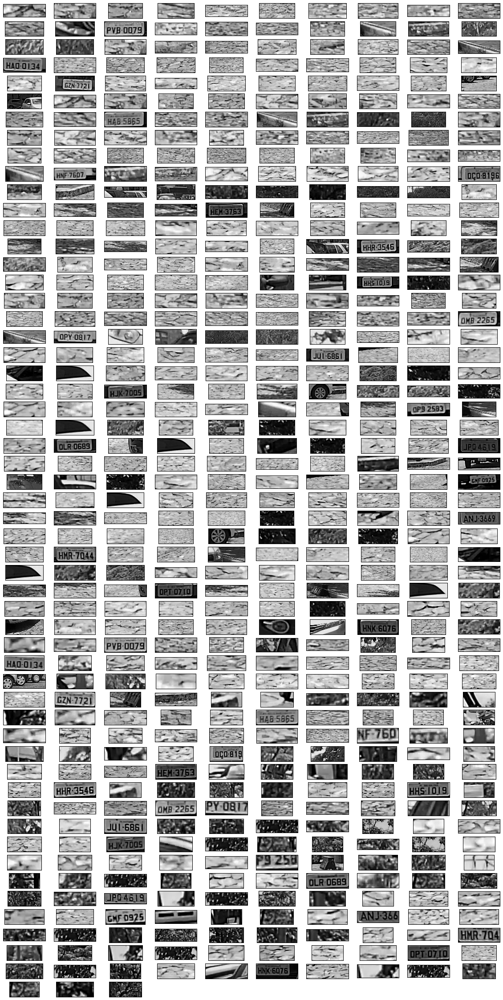

In [16]:
cnd_nb = len(candidatos)
print 'Número de candidatos a placa:',cnd_nb
plt.figure(figsize=(20,40))
for i in range(cnd_nb):
    plt.subplot(cnd_nb/10+1,10,i+1)
    plt.imshow(candidatos[i],cmap='gray'), plt.xticks([]), plt.yticks([])

### 3. Algoritmo de seleção de melhor candidato

Foram testados algumas abordagens para a realização da filtragem de falsos objetos. A técnica a seguir foi a que obteve melhores resultados conseguindo isolar 40 objetos dos 543 acima, sendo 39 placas verdadeiras, 1 Falso Positivo e 3 Falsos Negativos. Ela faz uso do unsharp mask para destacar a bordas e alterar o histograma da imagem, melhorando o resultado do algoritmo de Otsu, aplica-se o fechamento para extração de ruídos e separação dos caracteres da placa. Em seguida, faz uma busca de contornos e conta a existencia de caracteres na placa. Se a imagem apresentar um número razoável de elementos é um forte indicil de que se trata dos caracteres, mas para se aumentar o grau de certeza observou-se a uniformidade desses contornos,i.e., se eles se encontram alinhados entre si, como é o caso da placa. Isso é feito através do desvio padrão dos pontos centrais sobre o eixo y de cada um dos contornos que compoem a figura.

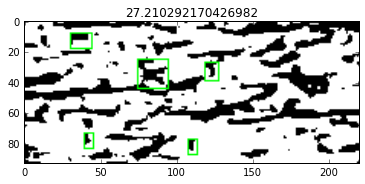

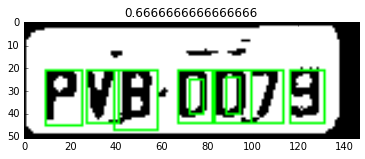

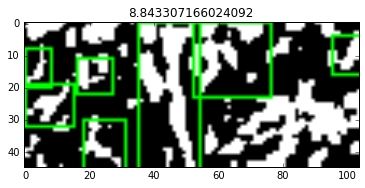

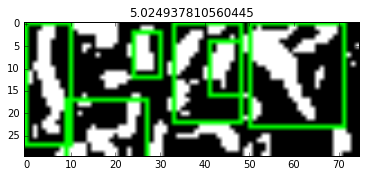

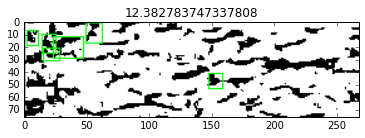

...

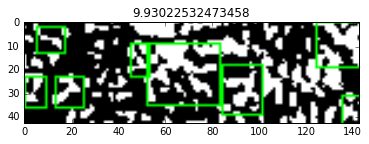

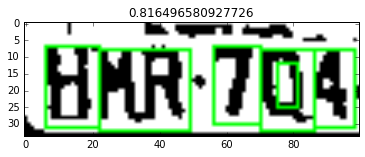

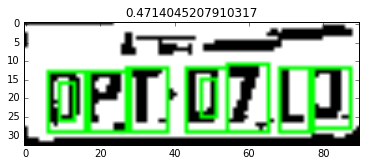

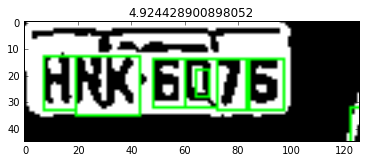

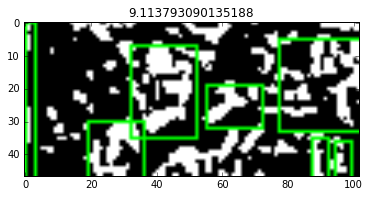

In [17]:
count_cand = 0
idx_selectedcand = []
for cand in candidatos:
    if(cand.shape[0]!=0 or cand.shape[1]!=0):
        gaussian = cv2.GaussianBlur(cand, (9,9), 10.0)
        unsharp_image = cv2.addWeighted(cand, 2, gaussian, -0.3, 0)
        ret,thr = cv2.threshold(unsharp_image,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        ker = cv2.getStructuringElement(cv2.MORPH_RECT,(2,2))
        mor = cv2.morphologyEx(thr,cv2.MORPH_CLOSE,ker)
        _,contours,hierarquia = cv2.findContours(mor, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        img_cont = cv2.cvtColor(thr,cv2.COLOR_GRAY2BGR)
        foundflag = 0
        center = []
        for cnt in contours:
            x,y,w,h = cv2.boundingRect(cnt)
            ar = 1.0*h/w
            if(h>=10 and w<=60 and ar > 0.7):
                foundflag = foundflag+1
                center.append(y+h/2)
                cv2.rectangle(img_cont,(x,y),(x+w,y+h),(0,255,0),1)   
        if foundflag >=5 :
            if(np.std(center) < 4):
                idx_selectedcand.append(count_cand)
            plt.figure()
            plt.title(str(np.std(center)))
            plt.imshow(img_cont,'gray')
    count_cand = count_cand + 1

Número de Placas detectadas:  40


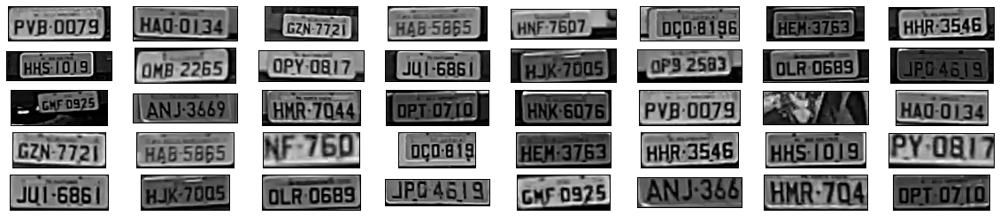

In [18]:
plt.figure(figsize=(20,5))
number = len(idx_selectedcand)
print 'Número de Placas detectadas: ',number
placas = []
for i in range(number):
    placas.append(candidatos[idx_selectedcand[i]]) 
    plt.subplot(number/8+1,8,i+1)
    plt.imshow(candidatos[idx_selectedcand[i]],cmap='gray'), plt.xticks([]), plt.yticks([])

### 4. Aperfeiçoamento do Algoritmo para melhoria dos Resultados

Esse algoritmo busca encontrar a placa partindo da imagem de placa já selecionada. Ele é usado de forma simples através de um busca por contornos externos. Esse algoritmo em caso de falha mantém o resultado anterior.

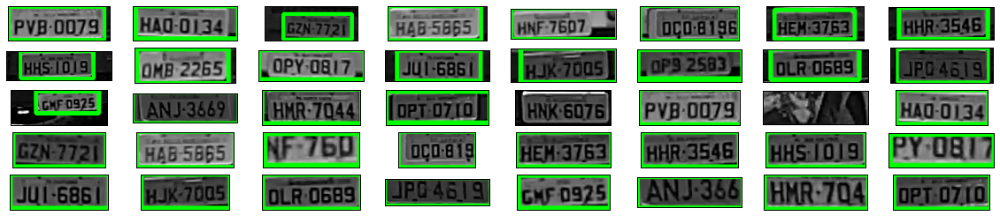

In [19]:
plt.figure(figsize=(20,5))
for i in range(len(placas)):
    _,thr = cv2.threshold(placas[i],0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    _,contours,_ = cv2.findContours(thr, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_cont = cv2.cvtColor(placas[i],cv2.COLOR_GRAY2BGR)
    #cv2.drawContours(img_cont, contours, -1, (0,255,0), 3)
    count_cnt = 0
    for cnt in contours:
        epsilon = 0.02*cv2.arcLength(cnt,True)
        approx = cv2.approxPolyDP(cnt,epsilon,True)
        if(len(approx) >= 3):
            x,y,w,h = cv2.boundingRect(cnt)
            if(w*h >= placas[i].shape[0]*placas[i].shape[1]/3):
                selected = [x,y,w,h]
                count_cnt+=1
                cv2.rectangle(img_cont,(x,y),(x+w,y+h),(0,255,0),3)
    plt.subplot(1+len(placas)/8,8,i+1),plt.imshow(img_cont,cmap='gray'),plt.xticks([]), plt.yticks([])

### 5. Resultados 

Os resultados dasdetecções foram comparados ao _GroundTruth_ fornecido pela base através do cálculo da interseção sobre a união (IoU - _Intersection over Union_). Nessa métrica o resultado assume um valor entre 0 e 1, em que 0 representa o não casamento das _boundingboxes_ detectadas, isto é não há interseção entre elas e 1 representa que as _boundingboxes_ são exatamente iguais. Dividiu-se os resultados obtidos nesse método nas seguintes categorias:
- **Errado**: IoU igual 0
- **Ruim**: IoU inferior a 0,7
- **Bom**: IoU entre 0,7 e 0,9
- **Excelente**: IoU acima de 0,9

Na Tabela abaixo é apresentado alguns resultados iniciais e o melhor resultado obtido. Esse último utilizou a abordagem um e o seletor com base na uniformidade dos caracteres. Além disso, o notebook com a implentação do IoU pode ser visualizado [aqui](IOU.ipynb).

Abordagem | Algoritmo de Seleção | Errado (%) | Ruim (%) | Bom (%) | Excelente (%) | Soma de bons com excelentes (%)
-----|-----|-----|-----|-----|-----|-----
Bordas|Comparação de Histograma|39,15|28,05|32,75|0,05|32,80
Bordas|Contornos Internos|45,65|13,90|28,75|11,70|40,45
Morfologia|Comparação de Histograma|69,75|2,15|12,95|15,15|28,10
Morfologia|Contornos Internos|45,20|3,35|23,20|28,25|51,45
**Bordas**|**Contornos Internos Uniformes**|**25,00**|**8,20**|**43,95**|**22,85**|**66,8**

Para efeito de visualização da dificuldade presentes nos dados utilizados, utilizou-se uma biblioteca de Reconhecimento Automático de Placas Veiculares OpenALPR em sua versão para placas brasileiras. **O OpenALPR conseguiu determinar um valor de leitura para 63% das imagens**, mas não foi considerado se esse valor estava correto ou não.

### 6. Referências

ANAGNOSTOPOULOS, C.-N. E. License plate recognition: A brief tutorial. IEEE Intelligent transportation systems magazine, IEEE, v. 6, n. 1, p. 59–67, 2014.

GONÇALVES, G. R. License Plate Recognition based on temporal redundancy. Dissertação(Mestrado) — Universidade Federal de Minas Gerais, Minas Gerais, 8 2016.

GONÇALVES, G. R. et al. Benchmark for license plate character segmentation. Journal of Electronic Imaging, v. 25, n. 5, p. 1–5, 2016. Disponível em: <http:www.ssig.dcc.ufmg.br/wp-content/uploads/2016/11/JEI-2016-Benchmark.pdf>.

OPENALPR TECHNOLOGY, INC. OpenALPR Documentation. 2017. 

OTSU, N. A threshold selection method from gray-level histograms. IEEE transactions on systems, man, and cybernetics, IEEE, v. 9, n. 1, p. 62–66, 1979.

PEDRINI, H.; SCHWARTZ, W. R. Análise de Imagens Digitais: Princípios, Algoritmos e Aplicações. São Paulo: THOMSON Learning, 2008.

SUZUKI, S. et al. Topological structural analysis of digitized binary images by border following. Computer vision, graphics, and image processing, Academic Press, v. 30, n. 1, p.32–46, 1985.